In [1]:
import os
import rich
import torch
import random

import pandas as pd
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F

from PIL import Image,UnidentifiedImageError
from tqdm import tqdm
from torchvision import transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset, Subset

In [2]:
def get_art_styles(root_dir):
    styles = []
    for style in os.listdir(root_dir):
        style_dir = os.path.join(root_dir, style)
        if os.path.isdir(style_dir):
            styles.append(style)
    return styles

current_path = os.getcwd()
root_dir = current_path+'/../data/raw'
art_styles = get_art_styles(root_dir)
print(art_styles)

['Academic_Art', 'Art_Nouveau', 'Baroque', 'Expressionism', 'Japanese_Art', 'Neoclassicism', 'Primitivism', 'Realism', 'Renaissance', 'Rococo', 'Romanticism', 'Symbolism', 'Western_Medieval']


In [3]:
class ArtDataset(Dataset):
    def __init__(self, root_dir, selected_styles, num_images_per_style=None, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images and subdirectories for art styles.
            selected_styles (list): List of art styles that need to be classified.
            num_images_per_style (int, optional): Number of images from each style.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.images = []
        self.labels = []
        self.style_counts = {}
        self.style_to_idx = {style: idx for idx, style in enumerate(selected_styles)}

        # Load images and labels
        for style in selected_styles:
            style_dir = os.path.join(root_dir, style,style)
            if os.path.isdir(style_dir):
                all = os.listdir(style_dir)
                cnt = len(all)
                self.style_counts[style] = cnt
                # Randomly select num_images_per_style images
                if num_images_per_style is None or num_images_per_style > cnt:
                    selected_images = all
                else:
                    selected_images = random.sample(all, 
                                                    min(num_images_per_style, cnt))
                for img in selected_images:
                    img_path = os.path.join(style_dir, img)
                    self.images.append(img_path)
                    self.labels.append(style)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        try:
            image = Image.open(img_name).convert('RGB')
            if self.transform:
                image = self.transform(image)
        except UnidentifiedImageError:
            print(f"Warning: Skipping file {img_name} as it couldn't be identified.")
            return self.__getitem__((idx + 1) % self.__len__())  # Return the next image

        # Convert label to index
        label_idx = self.style_to_idx[self.labels[idx]]
        return image, label_idx
    
    def get_random_image_by_style(self, style):
        style_dir = os.path.join(self.root_dir, style, style)
        if os.path.isdir(style_dir):
            images = os.listdir(style_dir)
            if images:
                random_image = random.choice(images)
                return os.path.join(style_dir, random_image)
        return None

In [4]:
# Example usage
if __name__ == "__main__":
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir=current_path+'/../data/raw', selected_styles=art_styles)

    # Example of accessing the first item
    image, label = dataset[8888]
    print(label)

2


### Style distribution

In [5]:
def plot_style_distribution(style_counts):
    # Convert to DataFrame for easy plotting
    df = pd.DataFrame(list(style_counts.items()), columns=['Art Style', 'Count'])
    df = df.sort_values('Count', ascending=False)
    colors = plt.cm.rainbow(df['Count'].rank()/len(df['Count']))

    # Plotting
    plt.figure(figsize=(12, 8), dpi=200)
    plt.barh(df['Art Style'], df['Count'], color=colors)
    plt.xlabel('Number of Images')
    plt.ylabel('Art Style')
    plt.title('Distribution of Art Styles')
    plt.gca().invert_yaxis()
    plt.show()

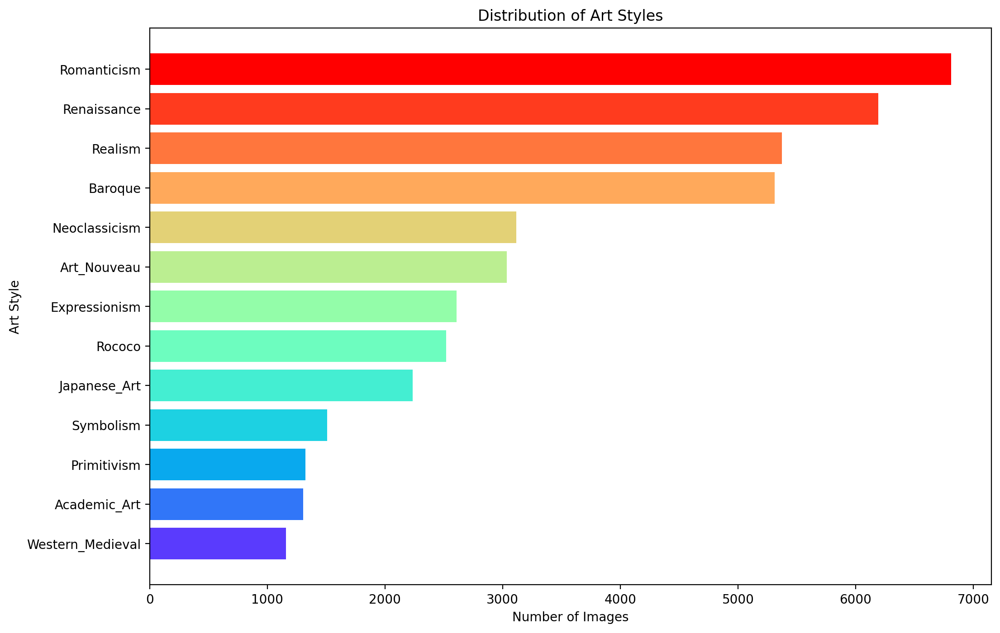

In [6]:
# Example usage
if __name__ == "__main__":
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir=current_path+'/../data/raw', selected_styles=art_styles)

    plot_style_distribution(dataset.style_counts)


In [7]:
def display_random_images(dataset):
	styles = set(dataset.labels)
	fig = plt.figure(figsize=(20, 10), dpi=200)
	fig.subplots_adjust(hspace=.5)

	for i, style in enumerate(styles):
		ax = plt.subplot(2, 7, i + 1)
		img_path = dataset.get_random_image_by_style(style)
		image = Image.open(img_path)

		ax.imshow(image)
		ax.set_title(style)
		ax.axis('off')

	plt.tight_layout()
	plt.show()

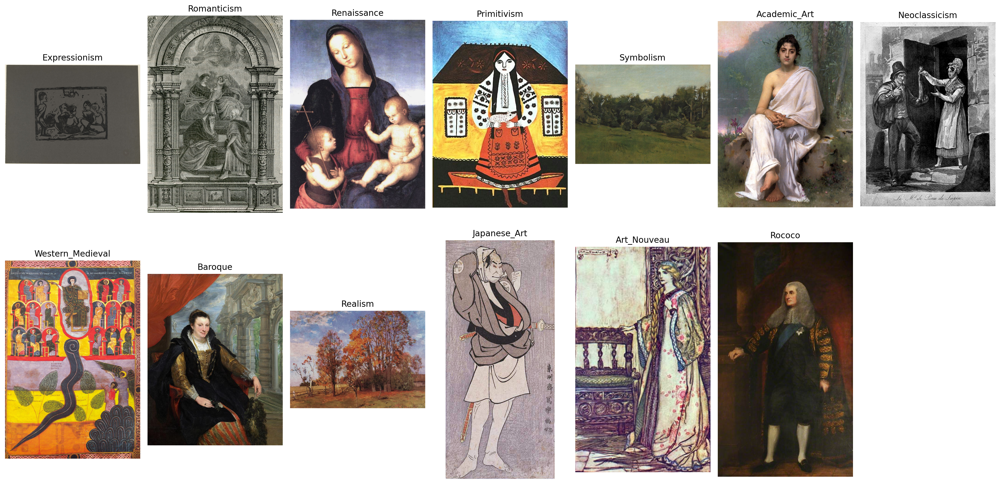

In [8]:
# Example usage
if __name__ == "__main__":
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir=current_path+'/../data/raw', selected_styles=art_styles)

    display_random_images(dataset)

## The model

In [9]:
class ArtCNN(nn.Module):
    def __init__(self, num_classes):
        super(ArtCNN, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)

        # Pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Adaptive pooling layer
        self.adaptive_pool = nn.AdaptiveAvgPool2d((128, 128))

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 128 * 128, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, num_classes)

    def forward(self, x):
        # Apply convolutional layers and pooling
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Apply adaptive pooling
        x = self.adaptive_pool(x)

        # Flatten the tensor
        x = x.view(x.size(0), -1)

        # Apply fully connected layers
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)

        return x

In [10]:
# Testing here
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
dummy_input = torch.randn(1, 3, 1024, 1024)
model = ArtCNN(13).to(device)
model(dummy_input)

tensor([[ 0.0071,  0.0609,  0.0550,  0.0680,  0.0042, -0.0410,  0.0276,  0.1275,
          0.0313, -0.0162, -0.0021, -0.0457, -0.0221]],
       grad_fn=<AddmmBackward0>)

## Training the model

In [11]:
def train(model, train_loader, criterion, optimizer, num_epochs):
    model.train()
    print("Training the model...")
    for epoch in tqdm(range(num_epochs), desc="Epochs"):
        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as tepoch:
            for images, labels in tepoch:
                try:
                    images, labels = images.to(device), labels.to(device)

                    optimizer.zero_grad()
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    loss.backward()
                    optimizer.step()

                    # Update the progress bar with the loss
                    tepoch.set_postfix(loss=loss.item())
                except Exception as e:
                    print(f"An error occurred: {e}")
                    break
                
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}')

In [12]:
def evaluate(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total   += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    print(f'Accuracy: {100 * correct / total}%')

In [13]:
def pad_and_resize(img, target_size=(1024, 1024)):
    # Resize if any of the dimensions are greater than target size
    if img.size[0] > target_size[0] or img.size[1] > target_size[1]:
        # Scale down yet keeping the aspect ratio
        img.thumbnail(target_size, Image.Resampling.LANCZOS)
    
    # Calculate padding
    padding_l = (target_size[0] - img.size[0]) // 2
    padding_t = (target_size[1] - img.size[1]) // 2
    padding_r = target_size[0] - img.size[0] - padding_l
    padding_b = target_size[1] - img.size[1] - padding_t
    paddings  = (padding_l, padding_t, padding_r, padding_b)

    return transforms.functional.pad(img, paddings, padding_mode='constant', fill=0)

In [17]:
# Example usage
img = Image.open('../data/raw/Baroque/Baroque/186629.jpg').convert('RGB')
transformed_img = pad_and_resize(img)
transformed_img.show()

### Create a only three styles dataset then train the model

In [ ]:
if __name__ == '__main__':
    # Set the random seed to course number
    seed = 2476  
    
    # Device configuration
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    rich.print(f"Device: [red]{device}")

    # Transformations
    transform = transforms.Compose([
        transforms.Lambda(lambda img: pad_and_resize(img)),
        transforms.ToTensor(),
    ])
    
    # Set the parameters for dataloader
    selected_styles = ["Baroque", "Symbolism", "Japanese_Art"]
    num_images_per_style = 100
    
    # Create the dataset
    current_path = os.getcwd()
    dataset = ArtDataset(root_dir=current_path+'/data/raw', 
                         selected_styles=selected_styles, 
                         num_images_per_style=num_images_per_style,
                         transform=transform)
    
    # Split the dataset into training and test sets
    train_idx, test_idx = train_test_split(list(range(len(dataset))), test_size=0.2, random_state=seed)

    # Create subset for training and test from the indices
    train_dataset = Subset(dataset, train_idx)
    test_dataset  = Subset(dataset, test_idx)

    # Create data loaders for training and test sets
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    test_loader  = DataLoader(test_dataset, batch_size=64, shuffle=True)

    # Model
    num_classes = len(selected_styles)
    model = ArtCNN(num_classes).to(device)

    # Loss and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # Train the model
    num_epochs = 10
    train(model, train_loader, criterion,
          optimizer, num_epochs)
    
    # Save the model
    torch.save(model.state_dict(), 'art_model.pth')
    
    # Evaluate the model
    evaluate(model, test_loader)

Epochs: 100%|██████████| 10/10 [1:13:47<00:00, 442.71s/it]


Accuracy: 66.66666666666667%
